In [156]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


THIS SET OF HYPERPARAMETERS HAVE THE BEST PERFORMANCE SO FAR.

In [157]:
from MIOFlow.utils import generate_steps, set_seeds, config_criterion
from MIOFlow.models import make_model, Autoencoder
from MIOFlow.plots import plot_comparision, plot_losses
from MIOFlow.train import train_ae, training_regimen
from MIOFlow.losses import UOT_loss
from MIOFlow.constants import ROOT_DIR, DATA_DIR, NTBK_DIR, IMGS_DIR, RES_DIR
from MIOFlow.datasets import (
    make_diamonds, make_swiss_roll, make_tree, make_eb_data, 
    make_dyngen_data, make_diamonds_partial_holdout, make_branch_cond, make_dying_example_gaus, make_dying_example_unif
)
from MIOFlow.geo import setup_distance
from MIOFlow.exp import setup_exp
from MIOFlow.eval import generate_plot_data

import os, pandas as pd, numpy as np, \
    seaborn as sns, matplotlib as mpl, matplotlib.pyplot as plt, \
    torch, torch.nn as nn

from tqdm.notebook import tqdm
import time
from sklearn.preprocessing import StandardScaler
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

# Load dataset

In [158]:
phate_dims = 5
df = pd.read_csv('../../data/5-mioflow_data.csv')
df['samples'] = df['samples'].max() - df['samples']

# Subsample the dataframe so each group has equal number of points
min_group_size = df['samples'].value_counts().min()
df_balanced = df.groupby('samples').apply(lambda x: x.sample(min_group_size, random_state=42)).reset_index(drop=True)

# Verify the balanced dataset
print(df_balanced['samples'].value_counts())

# Replace the original dataframe with the balanced one
df = df_balanced

# from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df[['d1', 'd2']] = scaler.fit_transform(df[['d1', 'd2']])
# drop the rows whose samples are 3
# df = df[df['samples'] != 3]

samples
0    2832
1    2832
2    2832
3    2832
4    2832
Name: count, dtype: int64


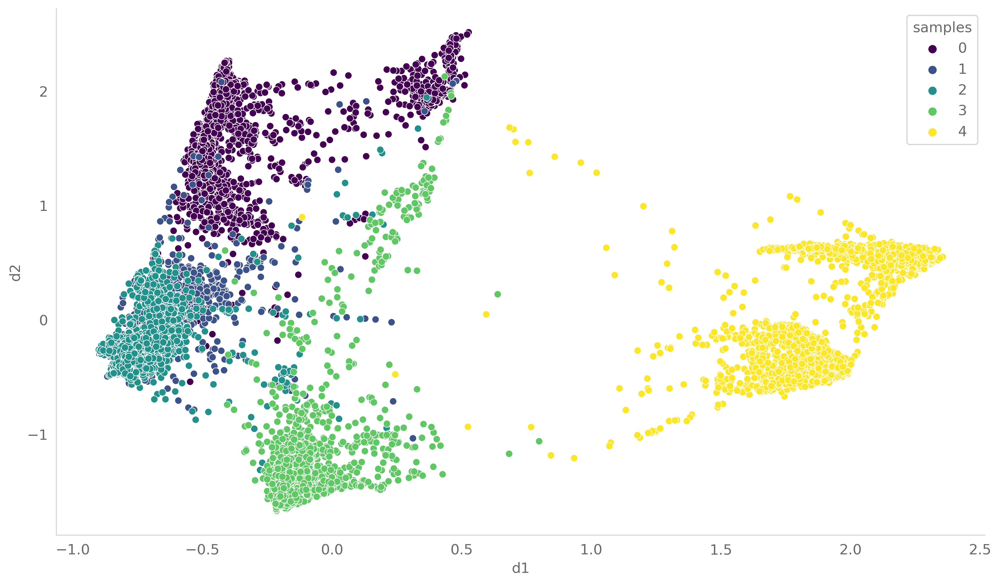

In [159]:
fig = plt.figure(figsize=(14, 8), dpi=300)
sns.scatterplot(data=df, x='d1', y='d2', hue='samples', palette='viridis');

In [160]:
df['samples'].value_counts()

samples
0    2832
1    2832
2    2832
3    2832
4    2832
Name: count, dtype: int64

In [161]:
# centroids = df.groupby('samples')[['d1', 'd2']].mean()
# centroid_distances = centroids.diff().dropna().apply(lambda row: np.linalg.norm(row), axis=1)

# # Revalue the samples column
# new_samples = [0]
# for distance in centroid_distances:
#     new_samples.append(new_samples[-1] + distance)
# df['samples'] = df['samples'].map(dict(zip(df['samples'].unique(), new_samples)))

In [162]:
# fig = plt.figure(figsize=(14, 8), dpi=300)
# sns.scatterplot(data=df, x='d1', y='d2', hue='samples', palette='viridis');

In [163]:
# scatter = plt.scatter(df['d1'], df['d2'], c=df['samples'], cmap='viridis', s=1, alpha=.5)
# # plt.colorbar(scatter, label='Samples')
# plt.legend(title='Samples', handles=[plt.scatter([], [], c=c, label=np.round(df['samples'].unique()[i], 2)) for i, c in enumerate(plt.cm.viridis(np.linspace(0, 1, len(df['samples'].unique()))))], loc='center left', bbox_to_anchor=(0.8, 0.8))
# plt.scatter(centroids['d1'], centroids['d2'], c='red', s=10, alpha=1)
# plt.tight_layout()
# plt.show()

# Train autoencoder or the geodesic embedding

#### Set seeds and check GPU

In [164]:
set_seeds(0)
use_cuda = torch.cuda.is_available()

#### Handle hold-out training condition

In [165]:
# This is True if we want to holdout (or skip) one timepoint during training. It is used to test the accuracy of the trajectories on unseen data.
hold_one_out = False
# It can be a group number or 'random', works in tandem with hold_one_out
hold_out = 3

# The dimensions in the input space, it is columns - 1 because we assume one column is equal to "samples".
model_features = len(df.columns) - 1
groups = sorted(df.samples.unique())

In [166]:
# These determine the logic flow for training: 
#   use_emb=True use_gae=False is only the encoder to match the approximation of the geodesic.
#   use_emb=False use_gae=True the full Geodesic Autoencoder (GAE), i.e. matching the geodesic and a reconstruction loss.
#   use_emb=False use_gae=False Is not using the GAE.
#   use_emb=True use_gae=True, is redundant and should raise an error. 
use_emb = False
use_gae = False

need_to_train_gae = (use_emb or use_gae) and use_emb != use_gae

# If the reconstruction loss needs to be computed.
recon = use_gae and not use_emb 

# These are training GAE hyperparameters needed for training
# Distance_type in ['gaussian', 'alpha_decay'], and Gaussian scale
distance_type = 'gaussian'
rbf_length_scale=0.1
dist = setup_distance(distance_type, rbf_length_scale=rbf_length_scale)

#Can be changed depending on the dataset
n_epochs_emb = 1000
samples_size_emb = (30, )

# Layers for the Geodesic Autoencoder
gae_embedded_dim = 32
encoder_layers = [model_features, 8, gae_embedded_dim]

gae = Autoencoder(
    encoder_layers = encoder_layers,
    decoder_layers = encoder_layers[::-1],
    activation='ReLU', use_cuda = use_cuda
)
optimizer = torch.optim.AdamW(gae.parameters())

#### Actually train the GAE

In [167]:
# Added in extra cell just for iterative programming / running of code
#   but could be added to code block above

if need_to_train_gae:
    start_time_geo = time.time()

    losses = train_ae(
        gae, df, groups, optimizer, 
        n_epochs=n_epochs_emb, sample_size=samples_size_emb,
        noise_min_scale=0.09, noise_max_scale=0.15, 
        dist=dist, recon=recon, use_cuda=use_cuda,
        hold_one_out=hold_one_out, hold_out=hold_out
    )
    run_time_geo = time.time() - start_time_geo

    print(run_time_geo)
    autoencoder = gae
else:
    autoencoder = None

# Specify parameters

In [168]:
set_seeds(10)

#Directory where results are saved
exp_name = 'test'

# density loss knn
use_density_loss = True

# Weight of density (not percentage of total loss)
lambda_density = 35

# For petal=LeakyReLU / dyngen=CELU
activation = 'LeakyReLU'

# Can change but we never really do, mostly depends on the dataset.
layers = [16,32,16]

# Scale of the noise in the trajectories. Either len(groups)*[float] or None. Should be None if using an adaptative ODE solver.
sde_scales = len(groups)*[0.1] 

if recon:    
    model_features = gae_embedded_dim

model = make_model(
    model_features, layers, 
    activation=activation, scales=sde_scales, use_cuda=use_cuda,
    # which='sde_growth_rate',
    which='ode_growth_rate',
    # m_transform='exp', # TODO try relu and exp
    m_transform='relu', # TODO try relu and exp
    # method='euler',
    time_homogeneous=True,
    unif_velo=True,
)

In [169]:
# Basically "batch size"
sample_size=(50, )

# Training specification
# n_local_epochs = 20
n_local_epochs = 40
# n_epochs = 20
n_epochs = 0
n_post_local_epochs = 0

# Using the reverse trajectories to train
reverse_schema = False
# reverse_schema = False 
# each reverse_n epoch
reverse_n = 2


# criterion_name = 'ot'
# criterion_name = 'density_specified_ot'
# criterion = config_criterion(criterion_name, reg=0.2, detach_M_ot=False)
# print(criterion.detach_M_ot)

optimizer = torch.optim.AdamW(model.parameters())

# Bookkeeping variables
batch_losses = []
globe_losses = []
if hold_one_out and hold_out in groups:
    local_losses = {f'{t0}:{t1}':[] for (t0, t1) in generate_steps(groups) if hold_out not in [t0, t1]}
else:
    local_losses = {f'{t0}:{t1}':[] for (t0, t1) in generate_steps(groups)}

# For creating output.
n_points = 50
n_trajectories = 50
n_bins = 100


In [170]:
opts = {
    'phate_dims': phate_dims,
    'use_cuda': use_cuda,
    'model_features': model_features,
    'exp_name': exp_name,
    'groups': groups,
    'sample_size': sample_size,
    'use_emb': use_emb,
    'n_local_epochs': n_local_epochs,
    'n_epochs': n_epochs,
    'n_post_local_epochs': n_post_local_epochs,
    # 'criterion_name': criterion_name,
    'hold_one_out': hold_one_out,
    'use_density_loss': use_density_loss,
    'n_points': n_points,
    'n_trajectories': n_trajectories,
    'n_bins': n_bins,
    'autoencoder': autoencoder,
    'activation_ode': activation,
    'layer': layers,
    'lambda_density':lambda_density,
    'use_gae': use_gae,
    'sde_scales': sde_scales,
    'hold_out':hold_out,
    'encoder_layers': encoder_layers,
    'n_epochs_emb': n_epochs_emb,
    'samples_size_emb': samples_size_emb,
    'recon': recon,
    'distance_type':distance_type,
    'rbf_length_scale':rbf_length_scale,
    'reverse_schema': reverse_schema,
    'reverse_n': reverse_n
}

In [171]:
exp_dir, logger = setup_exp(RES_DIR, opts, exp_name) 

In [172]:
"""
'Pretraining' -- with a large penalty on m being non-constant, to stablize the trajectories
"""
criterion = UOT_loss(reg_m_l2=[5., 5.], detach_M=True, detach_m=True, use_uniform=False) # large penalty on matching target mass
# criterion = UOT_loss(reg_m_l2=[1., 1.], detach_M=True, detach_m=True, use_uniform=True) # large penalty on matching target mass
start_time = time.time()
local_losses, batch_losses, globe_losses, losses_dict = training_regimen(
    # local, global, local train structure
    n_local_epochs=40, 
    n_epochs=40, 
    n_post_local_epochs=n_post_local_epochs,
    n_batches=5,
    # where results are stored
    exp_dir=exp_dir, 

    # BEGIN: train params
    model=model, df=df, groups=groups, optimizer=optimizer, 
    criterion=criterion, use_cuda=use_cuda,
    
    hold_one_out=hold_one_out, hold_out=hold_out,
    
    use_density_loss=use_density_loss, density_detach_m=False,
    lambda_density=35.,
    # lambda_density=100.,
    
    autoencoder=autoencoder, use_emb=use_emb, use_gae=use_gae, 
    
    sample_size=sample_size, logger=logger,
    reverse_schema=False, reverse_n=1,
    use_penalty=False, lambda_energy=10.,
    use_penalty_m=False, lambda_energy_m=10.,
    lambda_m=1., lambda_m2=10.,
    lambda_ot=10., lambda_marginal=0.,
    energy_weighted=True,
    energy_detach_m=False,

    # regularizations for diffusion term
    diffusion_lambda_energy=.0,
    diffusion_lambda_energy_m=.0,
    diffusion_energy_weighted=True,
    diffusion_energy_detach_m=False,

    # END: train params

    plot_every=5,
    n_points=n_points, n_trajectories=n_trajectories, n_bins=n_bins, 
    #local_losses=local_losses, batch_losses=batch_losses, globe_losses=globe_losses
    use_kde=False,

    lambda_unif_velo=1.,
    unif_velo_weighted=False,
    unif_velo_detach_m=True,
    unif_velo_square=True,
    unif_velo_topk=1,
)
run_time = time.time() - start_time + run_time_geo if use_emb or use_gae else time.time() - start_time
logger.info(f'Total run time: {np.round(run_time, 5)}')

Pretraining Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Posttraining Epoch: 0it [00:00, ?it/s]

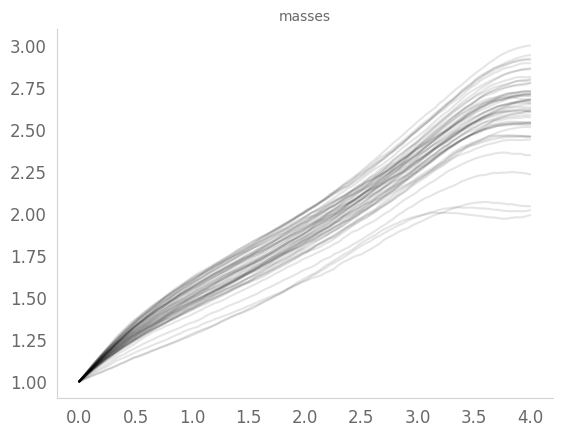

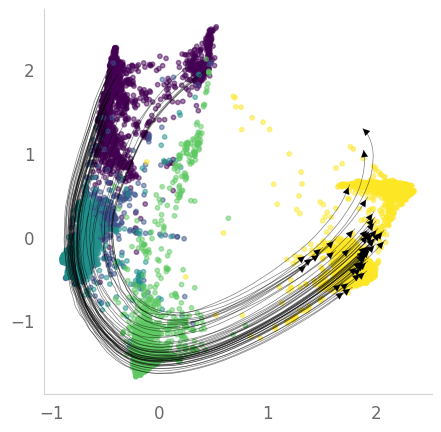

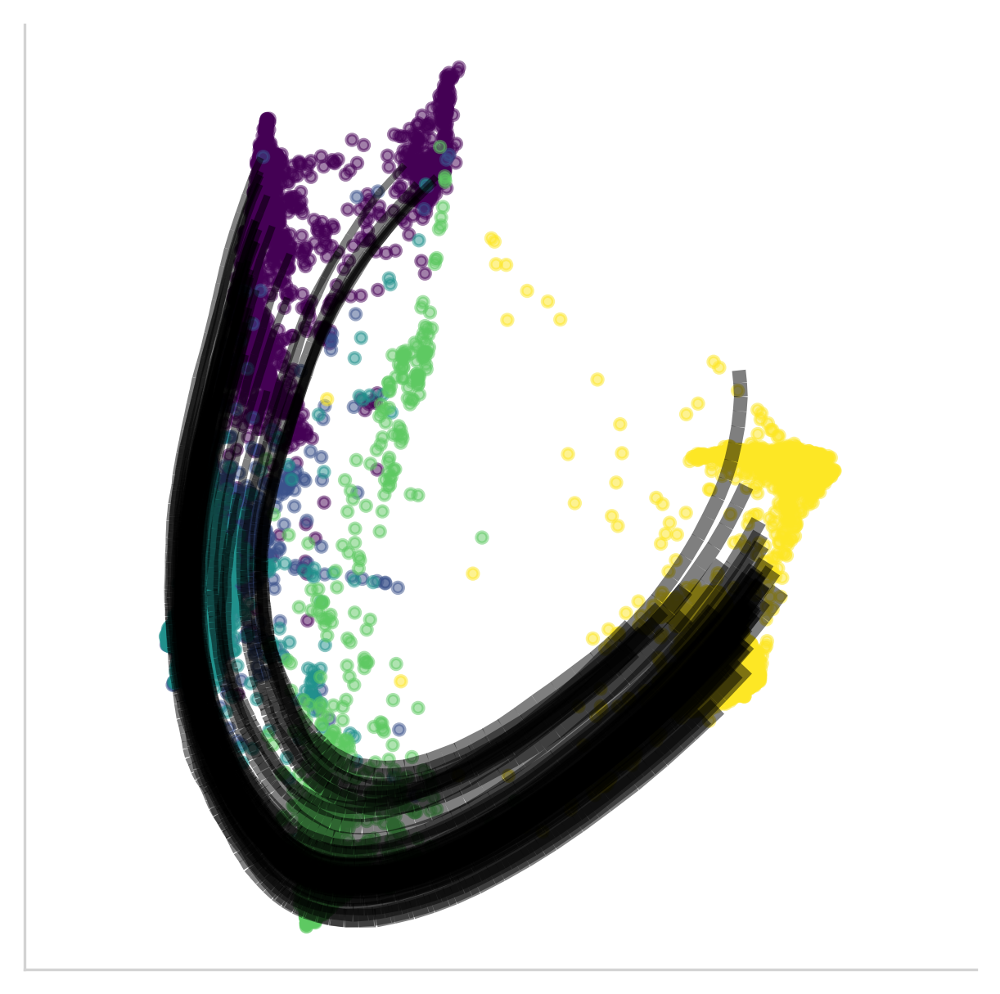

In [173]:
np.random.seed(32)
groups = sorted(df['samples'].unique())
sample_time = np.linspace(np.min(groups), np.max(groups), n_bins)
from MIOFlow.utils import sample
data_t0 = sample(
    df, np.min(groups), size=(n_points, ), 
    replace=False, to_torch=True, use_cuda=use_cuda
)
sample_time = torch.tensor(sample_time, dtype=data_t0.dtype, device=data_t0.device)

from MIOFlow.losses import hard_softmax
# threshold_factor = 0.3
with torch.no_grad():
    x_traj, m_traj = model(data_t0, sample_time, return_whole_sequence=True)
    m_traj0 = m_traj
    # m_traj = torch.exp(m_traj)
    # m_traj1 = m_traj
    # threshold = 0.3
    # m_traj2 = torch.nn.functional.sigmoid(m_traj)
    # m_traj2 = torch.where(m_traj2 < threshold, torch.zeros_like(m_traj2), m_traj2)
# threshold = threshold_factor * m_traj.mean(dim=-1, keepdim=True)
# m_traj = torch.where(m_traj <= threshold, torch.tensor(0., dtype=m_traj.dtype, device=m_traj.device), m_traj)
# m_traj = hard_softmax(m_traj, dim=-1)
# m_traj2 = nn.functional.softmax(m_traj0, dim=-1)
x_traj = x_traj.cpu().numpy()
# m_traj_softmax = nn.functional.softmax(m_traj0, dim=-1).cpu().numpy()
m_traj0 = m_traj0.cpu().numpy()
# threshold = 1/m_traj.shape[-1]
# m_traj[m_traj < threshold] = 0.
# m_traj = m_traj / m_traj.max()
m_traj = m_traj.cpu().numpy()
# m_traj1 = m_traj1.cpu().numpy()
# m_traj = np.exp(m_traj)
# m_traj = m_traj / m_traj[0,0]
# m_traj3 = m_traj1 / m_traj1.max()


plt.figure()
for i in range(n_points):
    plt.plot(sample_time.cpu().numpy(), m_traj0[:,i], c='black', alpha=0.1)
    plt.title('masses')


# plt.figure()
# for i in range(n_points):
#     plt.plot(sample_time.cpu().numpy(), m_traj1[:,i], c='black', alpha=0.1)
#     plt.title('unnormalized probabilities')

# plt.figure()
# for i in range(n_points):
#     plt.plot(sample_time.cpu().numpy(), m_traj_softmax[:,i], c='black', alpha=0.1)
#     plt.title('softmax probabilities')


# plt.figure()
# for i in range(n_points):
#     plt.plot(sample_time.cpu().numpy(), m_traj[:,i], c='black', alpha=0.1)
#     plt.title('probabilities thresholded')

plt.figure(figsize=(5, 5))
plt.scatter(df['d1'], df['d2'],
                c=df['samples'] , cmap='viridis', s=10, alpha=.5)
for i,traj in enumerate(np.transpose(x_traj, axes=(1,0,2))):
    widths = m_traj[:,i]
    plt.plot(traj[:, 0], traj[:, 1], alpha=.5, linewidth=.5, color='Black');
    plt.annotate('', xy=(traj[-1, 0], traj[-1, 1]), xytext=(traj[-2, 0], traj[-2, 1]),
                 arrowprops=dict(arrowstyle="-|>", color='Black', lw=.1))

from matplotlib.collections import LineCollection

# m_trajt = m_traj_softmax/ m_traj_softmax.max()
m_trajt = m_traj
# when m_
plt.figure(figsize=(5, 5), dpi=300)
plt.scatter(df['d1'], df['d2'],
                c=df['samples'] , cmap='viridis', s=10, alpha=.5)
subsampled_points = np.random.choice(x_traj.shape[1], 40, replace=False)
for i in subsampled_points:
    # Use the width array to determine the linewidths for this trajectory
    traj = x_traj[:,i,:]
    linewidths = m_trajt[:,i] * 2
    
    # Create segments for the trajectory
    segments = [np.array([traj[j], traj[j+1]]) for j in range(len(traj)-1)]
    
    # Create a LineCollection with the segments and the corresponding linewidths
    lc = LineCollection(segments, linewidths=linewidths, color='black', alpha=0.5)
    plt.gca().add_collection(lc)

    # Add the arrow at the end of the trajectory
    # plt.annotate('', xy=(traj[-1, 0], traj[-1, 1]), xytext=(traj[-2, 0], traj[-2, 1]),
    #              arrowprops=dict(arrowstyle="-|>", color='Black', lw=.05))
# Autoscale to adjust plot limits
plt.gca().autoscale()
plt.xticks([])  # Hides x-axis ticks
plt.yticks([])  # Hides y-axis ticks
plt.axis('equal')

plt.show()


# m_trajt = m_traj2/ m_traj2.max()
# # m_trajt[m_trajt < 0.4] = 0
# # when m_
# plt.figure(figsize=(5, 5), dpi=300)
# plt.scatter(df['d1'], df['d2'],
#                 c=df['samples'] , cmap='viridis', s=10, alpha=.5)
# subsampled_points = np.random.choice(x_traj.shape[1], 40, replace=False)
# for i in subsampled_points:
#     # Use the width array to determine the linewidths for this trajectory
#     traj = x_traj[:,i,:]
#     linewidths = m_trajt[:,i] * 2
    
#     # Create segments for the trajectory
#     segments = [np.array([traj[j], traj[j+1]]) for j in range(len(traj)-1)]
    
#     # Create a LineCollection with the segments and the corresponding linewidths
#     lc = LineCollection(segments, linewidths=linewidths, color='black', alpha=0.5)
#     plt.gca().add_collection(lc)

#     # Add the arrow at the end of the trajectory
#     # plt.annotate('', xy=(traj[-1, 0], traj[-1, 1]), xytext=(traj[-2, 0], traj[-2, 1]),
#     #              arrowprops=dict(arrowstyle="-|>", color='Black', lw=.05))
# # Autoscale to adjust plot limits
# plt.gca().autoscale()
# plt.xticks([])  # Hides x-axis ticks
# plt.yticks([])  # Hides y-axis ticks
# plt.axis('equal')

# plt.show()

# m_trajt = m_traj
# m_trajt[m_trajt < 0.7] = 0
# m_trajt = m_trajt/ m_trajt.max()
# # when m_
# plt.figure(figsize=(5, 5), dpi=300)
# plt.scatter(df['d1'], df['d2'],
#                 c=df['samples'] , cmap='viridis', s=10, alpha=.5)
# subsampled_points = np.random.choice(x_traj.shape[1], 40, replace=False)
# for i in subsampled_points:
#     # Use the width array to determine the linewidths for this trajectory
#     traj = x_traj[:,i,:]
#     linewidths = m_trajt[:,i] * 2
    
#     # Create segments for the trajectory
#     segments = [np.array([traj[j], traj[j+1]]) for j in range(len(traj)-1)]
    
#     # Create a LineCollection with the segments and the corresponding linewidths
#     lc = LineCollection(segments, linewidths=linewidths, color='black', alpha=0.5)
#     plt.gca().add_collection(lc)

#     # Add the arrow at the end of the trajectory
#     # plt.annotate('', xy=(traj[-1, 0], traj[-1, 1]), xytext=(traj[-2, 0], traj[-2, 1]),
#     #              arrowprops=dict(arrowstyle="-|>", color='Black', lw=.05))
# # Autoscale to adjust plot limits
# plt.gca().autoscale()
# plt.xticks([])  # Hides x-axis ticks
# plt.yticks([])  # Hides y-axis ticks
# plt.axis('equal')

# plt.show()

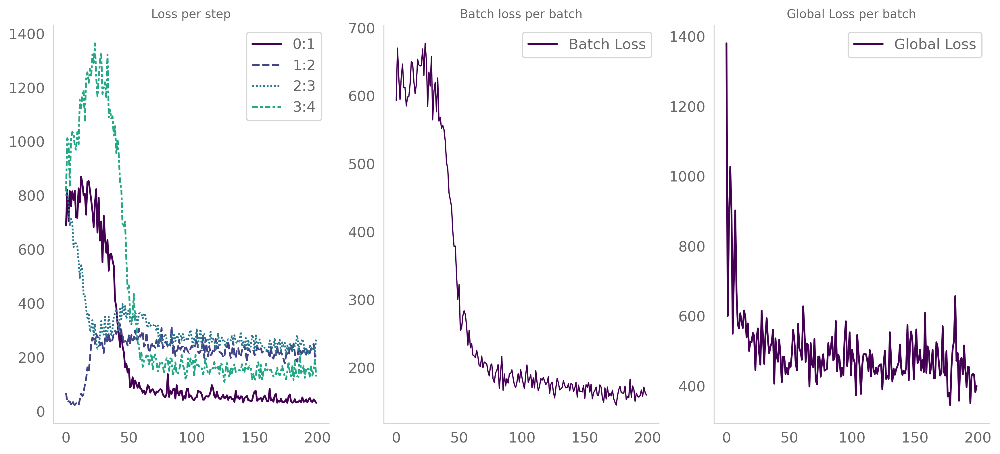

In [174]:
plot_losses(
    local_losses, batch_losses, globe_losses, 
    save=False,
)


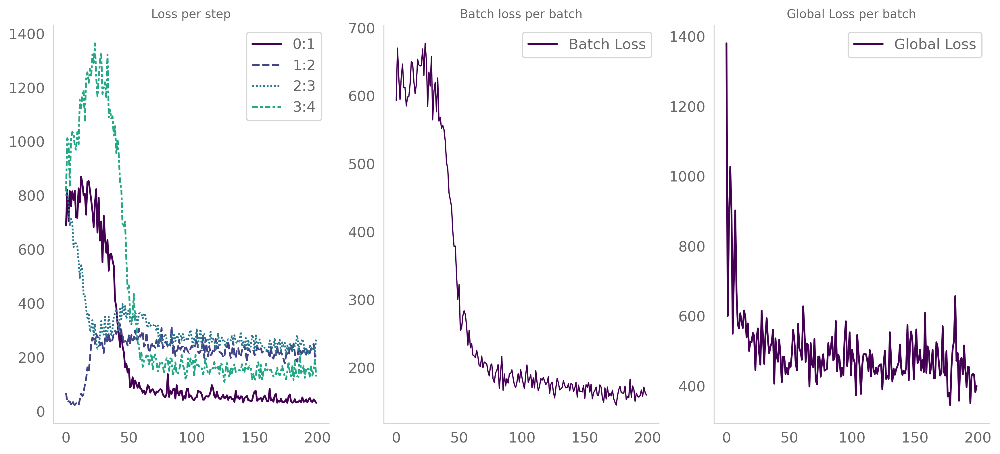

In [175]:
plot_losses(
    local_losses, batch_losses, globe_losses, 
    save=False,
)


In [176]:
with torch.no_grad():
    xtseq, mtseq = model(data_t0, sample_time, return_whole_sequence=True)
    xmseq = torch.cat([xtseq, mtseq.unsqueeze(-1)], dim=-1)
    dxdt = torch.stack([model.func(sample_time[i], xmseq[i]) for i in range(len(sample_time))])

In [177]:
v_norm = torch.square(dxdt[...,:-1]).sum(axis=-1)
mv_norm = torch.square(dxdt[...,-1])

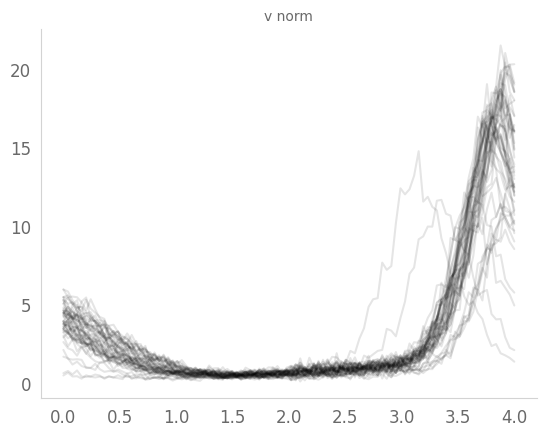

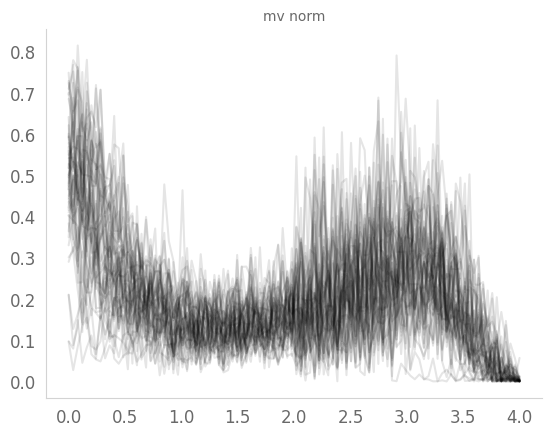

In [178]:
plt.figure()
for i in range(n_points):
    plt.plot(sample_time.cpu().numpy(), v_norm[:,i], c='black', alpha=0.1)
    plt.title('v norm')
plt.figure()
for i in range(n_points):
    plt.plot(sample_time.cpu().numpy(), mv_norm[:,i], c='black', alpha=0.1)
    plt.title('mv norm')

In [179]:
model.func.mean_velo_logit

Parameter containing:
tensor(0.4543, requires_grad=True)

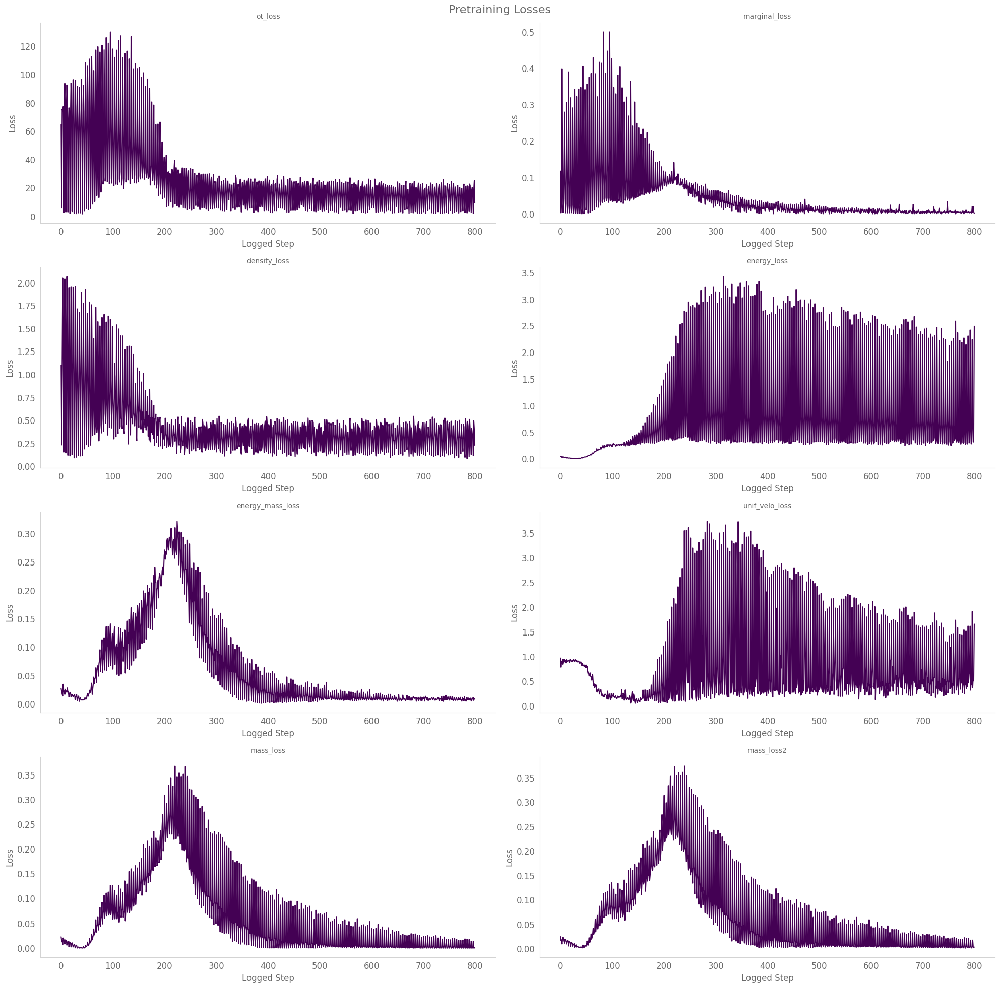

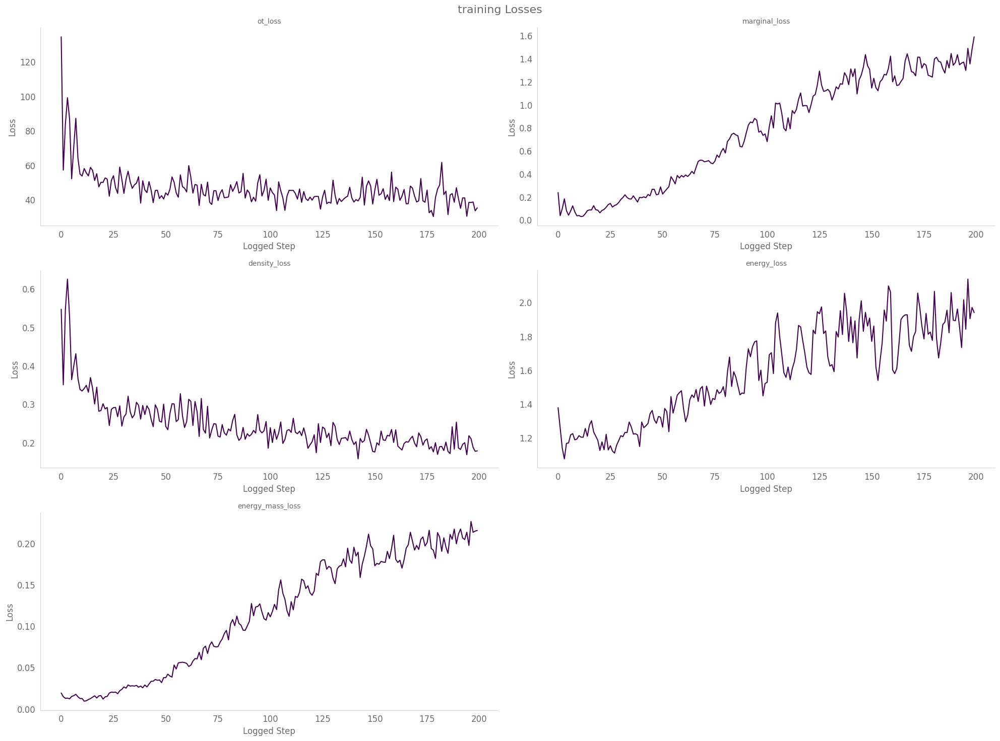

In [180]:
# Create DataFrame
res_df = pd.DataFrame({k:v for k,v in losses_dict['pretraining'].items() if len(v) == len(losses_dict['pretraining']['ot_loss'])})

# Create a figure with subplots for each column
fig, axes = plt.subplots(nrows=(len(res_df.columns)+1)//2, ncols=2, figsize=(20, 5*((len(res_df.columns)+1)//2)))
fig.suptitle('Pretraining Losses', fontsize=16)

# Flatten axes array for easier iteration
axes = axes.flatten()

# Plot each column
for i, column in enumerate(res_df.columns):
    axes[i].plot(res_df.index, res_df[column])
    axes[i].set_title(column)
    axes[i].set_xlabel('Logged Step')
    axes[i].set_ylabel('Loss')

# Remove any unused subplots
for i in range(len(res_df.columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

# Create DataFrame
res_df = pd.DataFrame({k:v for k,v in losses_dict['training'].items() if len(v) == len(losses_dict['training']['ot_loss'])})

# Create a figure with subplots for each column
fig, axes = plt.subplots(nrows=(len(res_df.columns)+1)//2, ncols=2, figsize=(20, 5*((len(res_df.columns)+1)//2)))
fig.suptitle('training Losses', fontsize=16)

# Flatten axes array for easier iteration
axes = axes.flatten()

# Plot each column
for i, column in enumerate(res_df.columns):
    axes[i].plot(res_df.index, res_df[column])
    axes[i].set_title(column)
    axes[i].set_xlabel('Logged Step')
    axes[i].set_ylabel('Loss')

# Remove any unused subplots
for i in range(len(res_df.columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

In [181]:
os.getcwd()

'/Users/xingzhi/Research/MIOFlow_growth_rate/notebooks/cflows'

In [182]:
# save model
save_path = './'
torch.save(model, f'{save_path}/model.pt')
torch.save(model.state_dict(), f'{save_path}/model_state_dict.pt')

In [183]:
np.random.seed(32)
groups = sorted(df['samples'].unique())
sample_time = np.linspace(np.min(groups), np.max(groups), n_bins)
from MIOFlow.utils import sample
data_t0 = sample(
    df, np.min(groups), size=(n_points, ), 
    replace=False, to_torch=True, use_cuda=use_cuda
)
sample_time = torch.tensor(sample_time, dtype=data_t0.dtype, device=data_t0.device)

with torch.no_grad():
    x_traj, m_traj = model(data_t0, sample_time, return_whole_sequence=True)

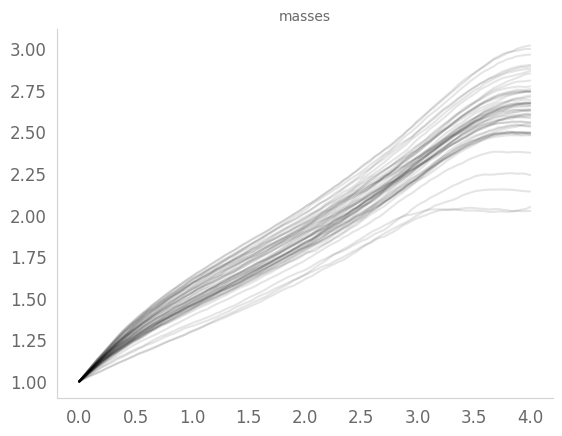

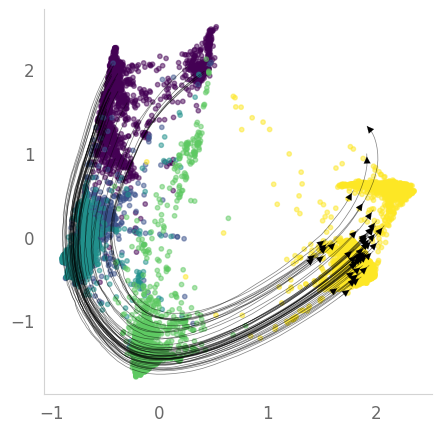

In [184]:
plt.figure()
for i in range(n_points):
    plt.plot(sample_time.cpu().numpy(), m_traj.cpu().numpy()[:,i], c='black', alpha=0.1)
    plt.title('masses')

plt.figure(figsize=(5, 5))
plt.scatter(df['d1'], df['d2'],
                c=df['samples'] , cmap='viridis', s=10, alpha=.5)
for i,traj in enumerate(np.transpose(x_traj, axes=(1,0,2))):
    widths = m_traj[:,i]
    plt.plot(traj[:, 0], traj[:, 1], alpha=.5, linewidth=.5, color='Black');
    plt.annotate('', xy=(traj[-1, 0], traj[-1, 1]), xytext=(traj[-2, 0], traj[-2, 1]),
                 arrowprops=dict(arrowstyle="-|>", color='Black', lw=.1))


In [185]:
# save x_traj, m_traj
torch.save(x_traj, f'{save_path}/x_traj.pt')
torch.save(m_traj, f'{save_path}/m_traj.pt')

In [222]:
np.random.seed(32)
groups = sorted(df['samples'].unique())
# sample_time = np.linspace(np.min(groups), np.max(groups), n_bins)
sample_time = groups
from MIOFlow.utils import sample
n_points_sample = 2000
data_t0 = sample(
    df, np.min(groups), size=(n_points_sample, ), 
    replace=False, to_torch=True, use_cuda=use_cuda
)
sample_time = torch.tensor(sample_time, dtype=data_t0.dtype, device=data_t0.device)

from MIOFlow.losses import hard_softmax
# threshold_factor = 0.3
with torch.no_grad():
    xh, mh = model(data_t0, sample_time, return_whole_sequence=True)
    xmseq = torch.cat([xh, mh.unsqueeze(2)], dim=-1)
    dxdts = torch.stack([model.func(sample_time[i], xmseq[i]) for i in range(len(sample_time))])
m_rate = dxdts[..., -1].cpu().numpy()
xh, mh = xh.cpu().numpy(), mh.cpu().numpy()
m_rate_log = m_rate / mh
growth_rate = np.exp(m_rate_log)
xh_time_label = np.array(sample_time).repeat(n_points_sample, axis=0).reshape(-1)

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: Figure

<Axes: >

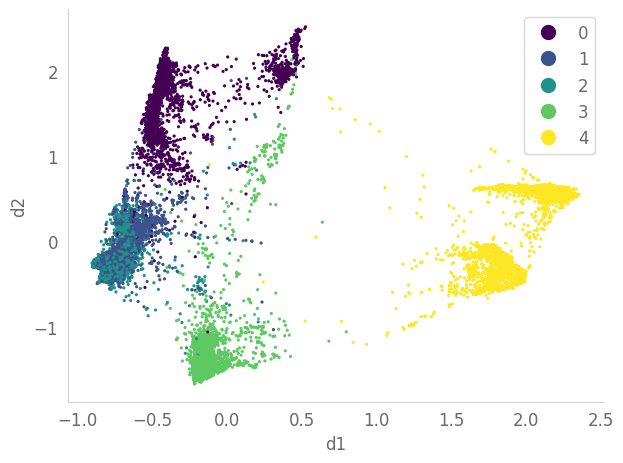

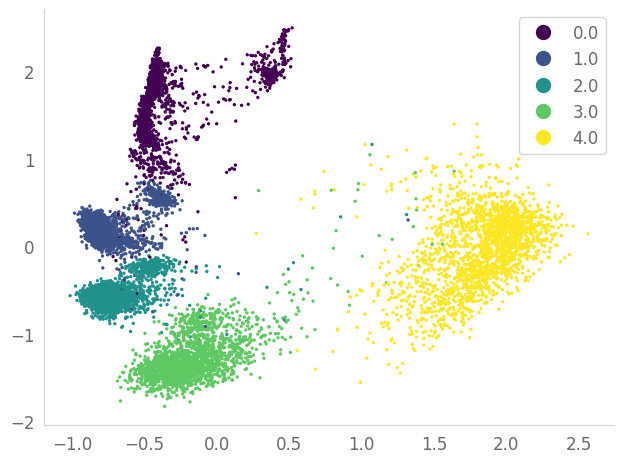

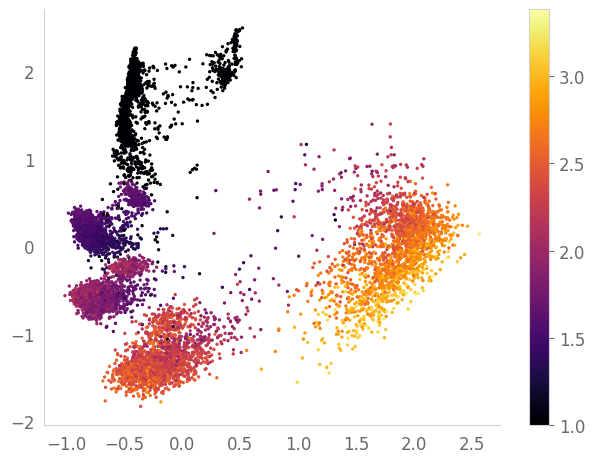

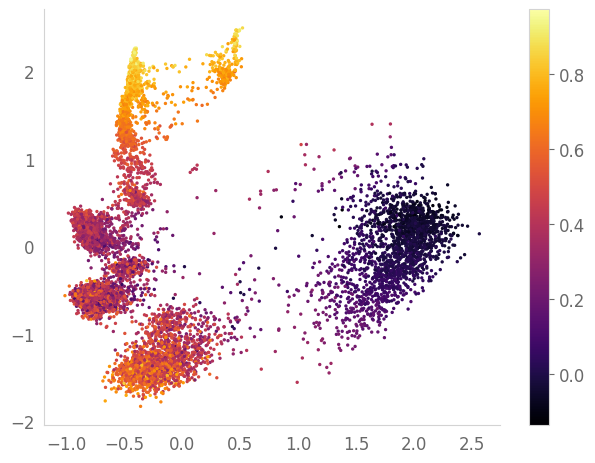

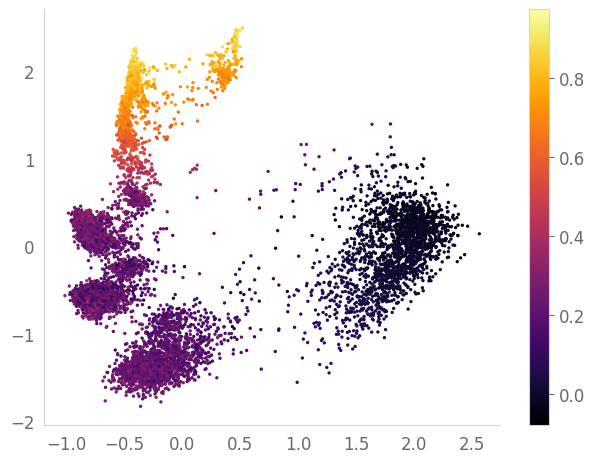

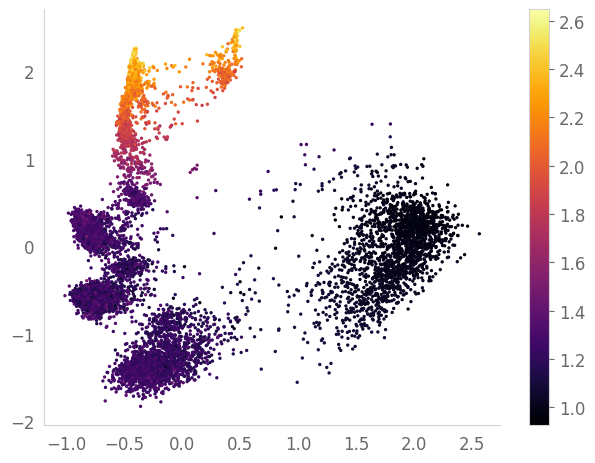

In [223]:
import scprep
scprep.plot.scatter2d(df[['d1', 'd2']], c=df['samples'], cmap='viridis')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=xh_time_label, cmap='viridis')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=mh.reshape(-1), cmap='inferno')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=m_rate.reshape(-1), cmap='inferno')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=m_rate_log.reshape(-1), cmap='inferno')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=growth_rate.reshape(-1), cmap='inferno')

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: >

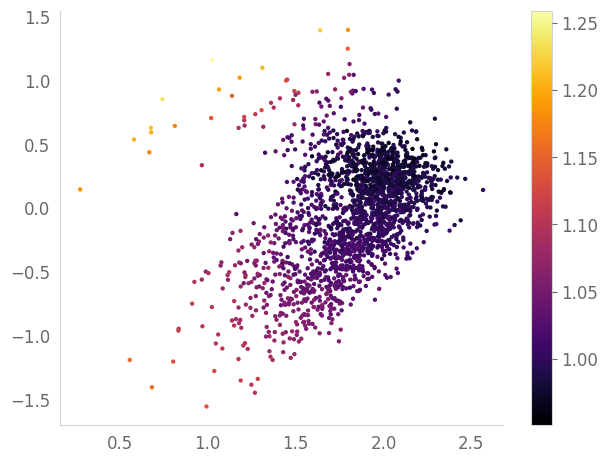

In [224]:
scprep.plot.scatter2d(xh[-1,...], c=growth_rate[-1,...], cmap='inferno')

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: >

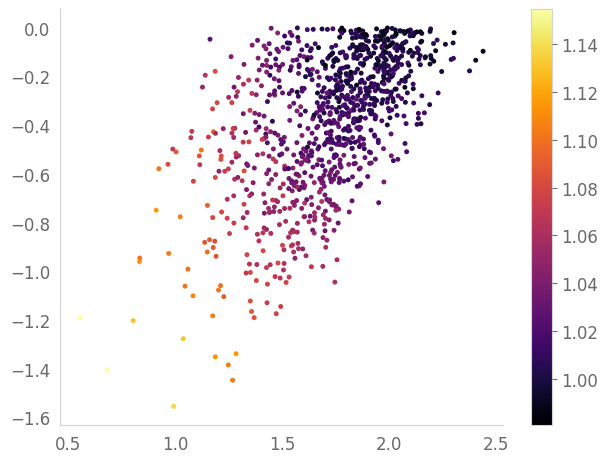

In [225]:
xh0 = xh[-1,...]
growth_rate0 = growth_rate[-1,...]
xh0_mask = xh0[:,1]<0
xh00 = xh0[xh0_mask]
growth_rate00 = growth_rate0[xh0_mask]
scprep.plot.scatter2d(xh00, c=growth_rate00, cmap='inferno')

In [226]:
torch.save(xh, f'{save_path}/xh.pt')
torch.save(mh, f'{save_path}/mh.pt')
torch.save(m_rate, f'{save_path}/m_rate.pt')
torch.save(m_rate_log, f'{save_path}/m_rate_log.pt')
torch.save(growth_rate, f'{save_path}/growth_rate.pt')

<Axes: xlabel='d1', ylabel='d2'>

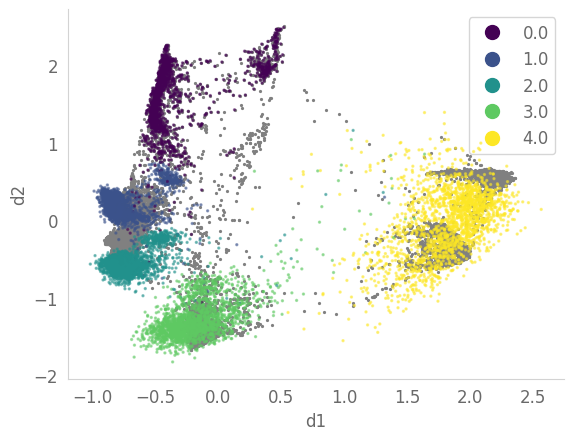

In [227]:
import scprep
fig = plt.figure()
ax = fig.add_subplot(111); scprep.plot.scatter2d(df[['d1', 'd2']], c='gray', ax=ax)
scprep.plot.scatter2d(xh.reshape(-1, 2), c=xh_time_label, alpha=.5, cmap='viridis', ax=ax)

In [232]:
import numpy as np
from scipy.spatial import cKDTree

# Convert dataframes to numpy arrays
df_points = df[['d1', 'd2']].values
xh_points = xh.reshape(-1, 2)

# Create a KD-tree for efficient nearest neighbor search
tree = cKDTree(xh_points)

# Find the index of the closest point in xh_points for each point in df_points
distances, indices = tree.query(df_points)

# Now 'indices' contains the index of the closest point in xh_points for each point in df_points
# You can use these indices to get the corresponding values from xh or other related arrays

# Example: Get the closest growth rates for each point in df
# closest_growth_rates = growth_rate.reshape(-1)[indices]
closest_growth_rates = m_rate.reshape(-1)[indices]
df_1 = df.copy()
# Optionally, you can add the results back to the original dataframe
df_1['closest_xh_index'] = indices
df_1['closest_growth_rate'] = closest_growth_rates

# Print the first few rows to verify
print(df_1[['d1', 'd2', 'closest_xh_index', 'closest_growth_rate']].head())


         d1        d2  closest_xh_index  closest_growth_rate
0 -0.511085  1.221349              1221             0.537804
1 -0.512381  1.388856              1791             0.631428
2 -0.522036  1.362557               692             0.666651
3 -0.522126  1.313749              1891             0.657714
4 -0.493953  1.504457               506             0.679583


/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: xlabel='d1', ylabel='d2'>

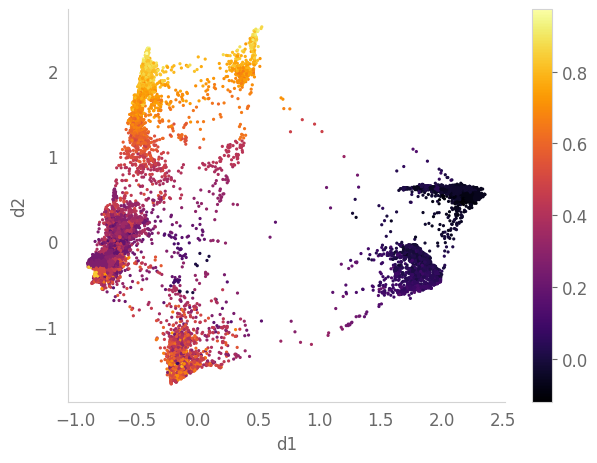

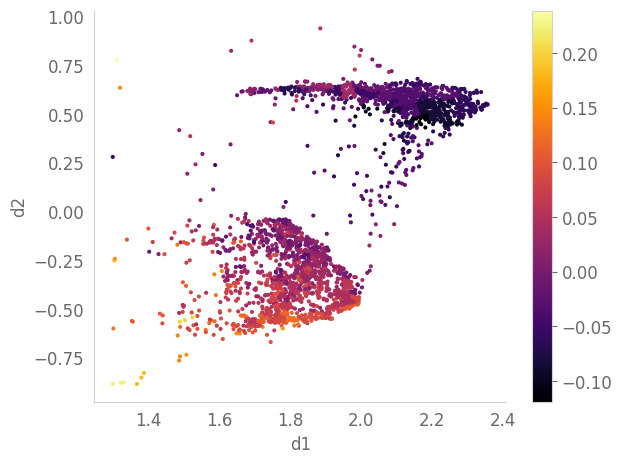

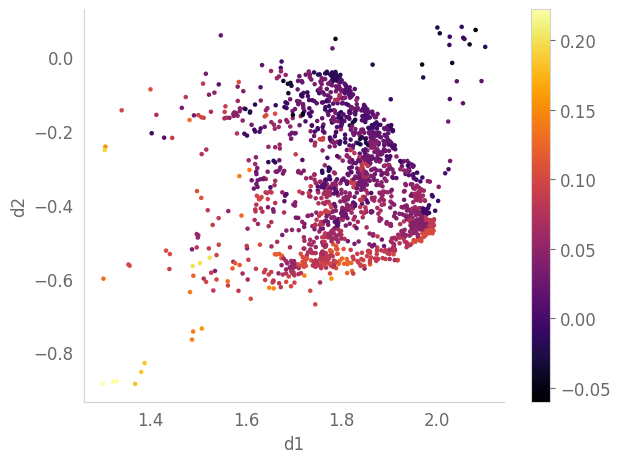

In [237]:
scprep.plot.scatter2d(df_1[['d1', 'd2']], c=df_1['closest_growth_rate'], cmap='inferno')
scprep.plot.scatter2d(df_1[['d1', 'd2']][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<1.0)], c=df_1['closest_growth_rate'][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<1.0)], cmap='inferno')
scprep.plot.scatter2d(df_1[['d1', 'd2']][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<0.1)], c=df_1['closest_growth_rate'][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<0.1)], cmap='inferno')

In [238]:
import numpy as np
from scipy.spatial import cKDTree

# Convert dataframes to numpy arrays
df_points = df[['d1', 'd2']].values
xh_points = xh.reshape(-1, 2)

# Create a KD-tree for efficient nearest neighbor search
tree = cKDTree(xh_points)

# Find the index of the closest point in xh_points for each point in df_points
distances, indices = tree.query(df_points)

# Now 'indices' contains the index of the closest point in xh_points for each point in df_points
# You can use these indices to get the corresponding values from xh or other related arrays

# Example: Get the closest growth rates for each point in df
# closest_growth_rates = growth_rate.reshape(-1)[indices]
closest_growth_rates = growth_rate.reshape(-1)[indices]
df_1 = df.copy()
# Optionally, you can add the results back to the original dataframe
df_1['closest_xh_index'] = indices
df_1['closest_growth_rate'] = closest_growth_rates

# Print the first few rows to verify
print(df_1[['d1', 'd2', 'closest_xh_index', 'closest_growth_rate']].head())


         d1        d2  closest_xh_index  closest_growth_rate
0 -0.511085  1.221349              1221             1.712242
1 -0.512381  1.388856              1791             1.880294
2 -0.522036  1.362557               692             1.947704
3 -0.522126  1.313749              1891             1.930375
4 -0.493953  1.504457               506             1.973055


/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: xlabel='d1', ylabel='d2'>

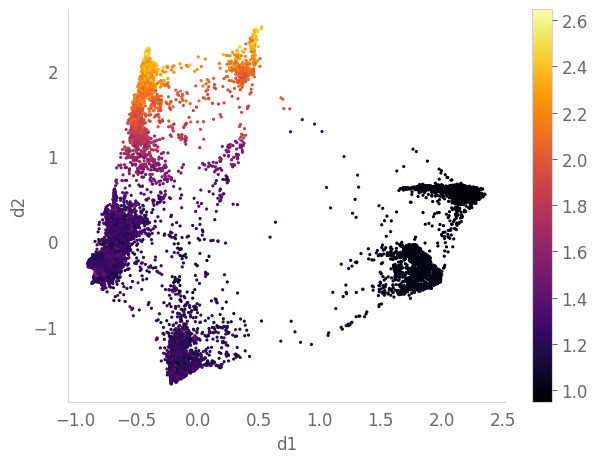

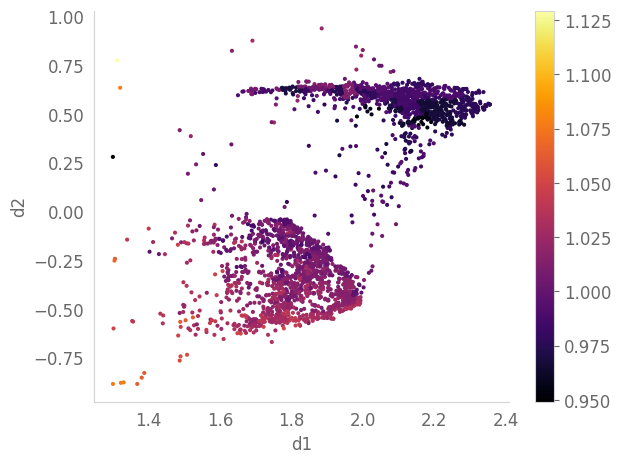

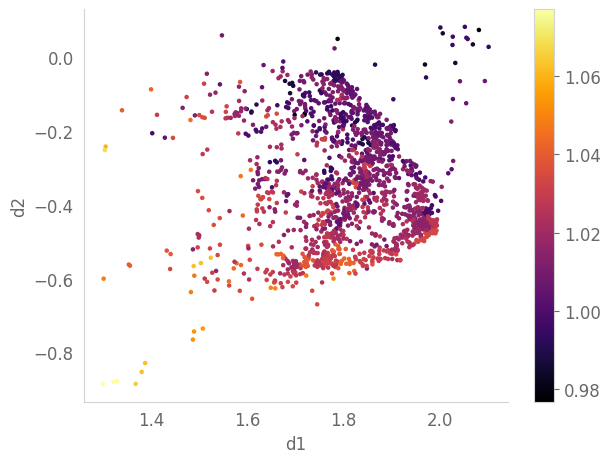

In [239]:
scprep.plot.scatter2d(df_1[['d1', 'd2']], c=df_1['closest_growth_rate'], cmap='inferno')
scprep.plot.scatter2d(df_1[['d1', 'd2']][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<1.0)], c=df_1['closest_growth_rate'][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<1.0)], cmap='inferno')
scprep.plot.scatter2d(df_1[['d1', 'd2']][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<0.1)], c=df_1['closest_growth_rate'][(df_1['samples']==4) & (df_1['d1']>1.3) & (df_1['d2']<0.1)], cmap='inferno')

In [234]:
assert False
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Convert dataframes to numpy arrays
np.random.seed(32)
df_sample = df.sample(n=1000)
df_points = df_sample[['d1', 'd2']].values
xh_points = xh.reshape(-1, 2)
growth_rate_values = growth_rate.reshape(-1)

# Perform kernel regression
kernel_reg = sm.nonparametric.KernelReg(growth_rate_values, xh_points, var_type=['c', 'c'], bw='cv')

# Predict smoothed growth rates for df_points
smoothed_growth_rates, _ = kernel_reg.fit(df_points)

# Create a new dataframe with the smoothed growth rates
df_1 = df_sample.copy()
df_1['smoothed_growth_rate'] = smoothed_growth_rates

# Print the first few rows to verify
print(df_1[['d1', 'd2', 'smoothed_growth_rate']].head())

# Plot results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df_points[:, 0], df_points[:, 1], c=smoothed_growth_rates, cmap='viridis')
plt.colorbar(scatter, label='Smoothed Growth Rate')
plt.title('Kernel Regression: Smoothed Growth Rates')
plt.xlabel('d1')
plt.ylabel('d2')
plt.show()


KeyboardInterrupt: 

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: xlabel='d1', ylabel='d2'>

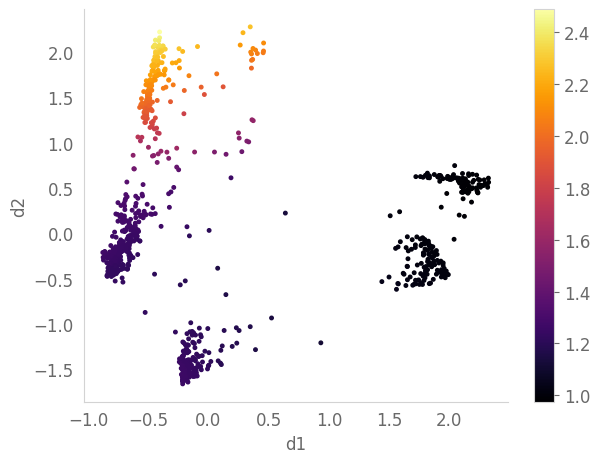

In [ ]:
scprep.plot.scatter2d(df_1[['d1', 'd2']], c=df_1['smoothed_growth_rate'], cmap='inferno')

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: xlabel='d1', ylabel='d2'>

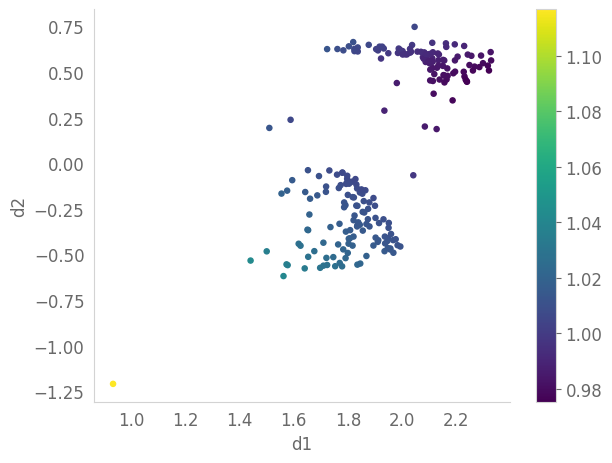

In [ ]:
scprep.plot.scatter2d(df_1[['d1', 'd2']][(df_1['samples']==4) & (df_1['d1']>0.6)], c=df_1['smoothed_growth_rate'][(df_1['samples']==4) & (df_1['d1']>0.6)], cmap='viridis')

In [ ]:
import scanpy as sc
all_data = df[['d1', 'd2']].values
adata = sc.AnnData(all_data)
adata.obsm['X_phate'] = all_data
adata.obs['samples'] = df['samples'].values
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_phate')
sc.tl.diffmap(adata)
adata.uns['iroot'] = np.argmin(adata.obsm['X_phate'][:,1])
sc.tl.dpt(adata)

In [ ]:
dpt_bin = pd.cut(adata.obs['dpt_pseudotime'].values, bins=3, labels=False)

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: >

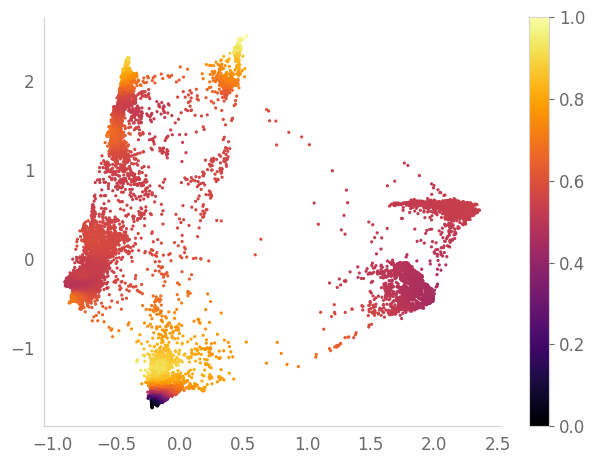

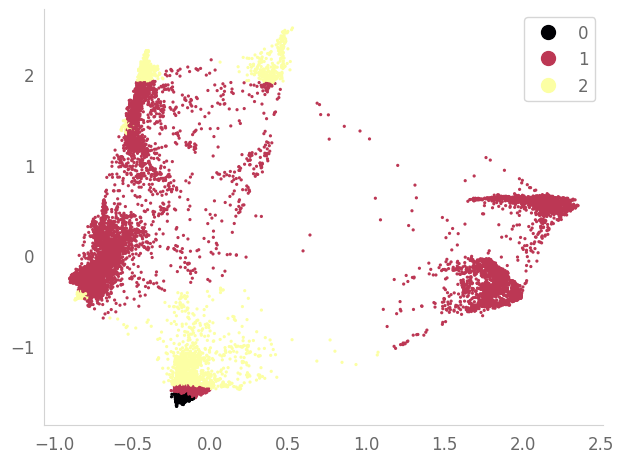

In [ ]:
scprep.plot.scatter2d(all_data, c=adata.obs['dpt_pseudotime'].values, cmap='inferno')
scprep.plot.scatter2d(all_data, c=dpt_bin, cmap='inferno')

In [ ]:
x = torch.tensor(last_tp, dtype=torch.float32)
t = torch.tensor(adata.obs['dpt_pseudotime'].values, dtype=torch.float32)

In [ ]:
model.

SyntaxError: invalid syntax (1068564517.py, line 1)

In [ ]:
assert False

In [ ]:
np.random.seed(32)
groups = sorted(df['samples'].unique())
n_bins = 10
sample_time = np.linspace(np.min(groups), np.max(groups), n_bins)
from MIOFlow.utils import sample
n_points_sample = 2000
data_t0 = sample(
    df, np.min(groups), size=(n_points_sample, ), 
    replace=False, to_torch=True, use_cuda=use_cuda
)
sample_time = torch.tensor(sample_time, dtype=data_t0.dtype, device=data_t0.device)

# from MIOFlow.losses import hard_softmax
# threshold_factor = 0.3
with torch.no_grad():
    xh, mh = model(data_t0, sample_time, return_whole_sequence=True)
    xmseq = torch.cat([xh, mh.unsqueeze(2)], dim=-1)
    dxdts = torch.stack([model.func(sample_time[i], xmseq[i]) for i in range(len(sample_time))])
m_rate = dxdts[..., -1].cpu().numpy()
xh, mh = xh.cpu().numpy(), mh.cpu().numpy()
m_rate_log = m_rate / mh
xh_time_label = np.array(sample_time).repeat(n_points_sample, axis=0).reshape(-1)

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: >

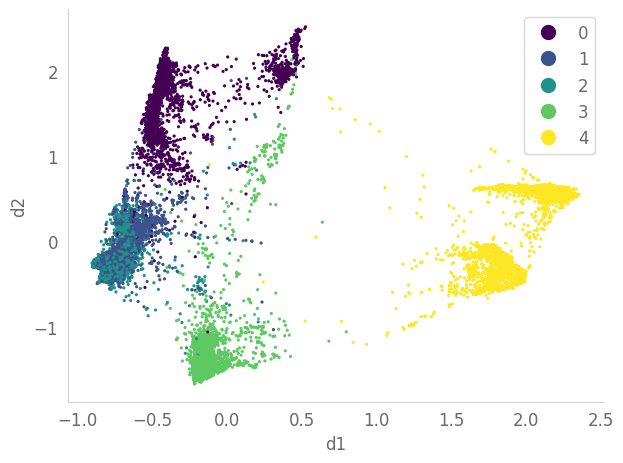

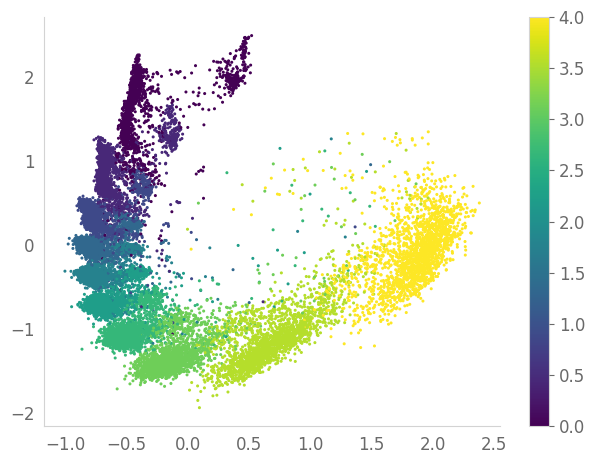

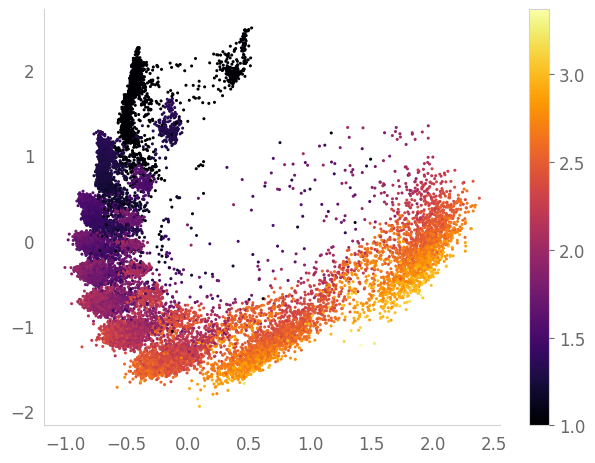

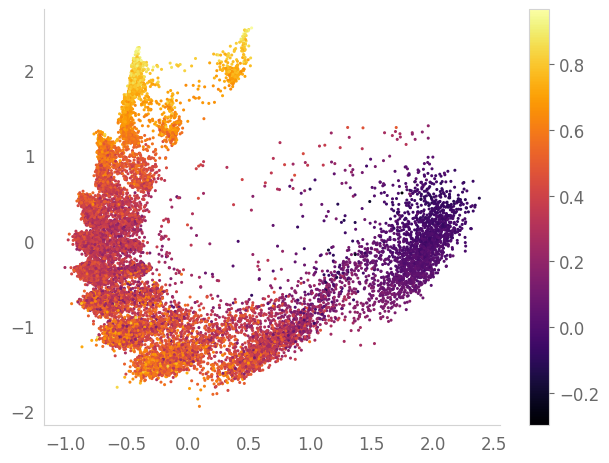

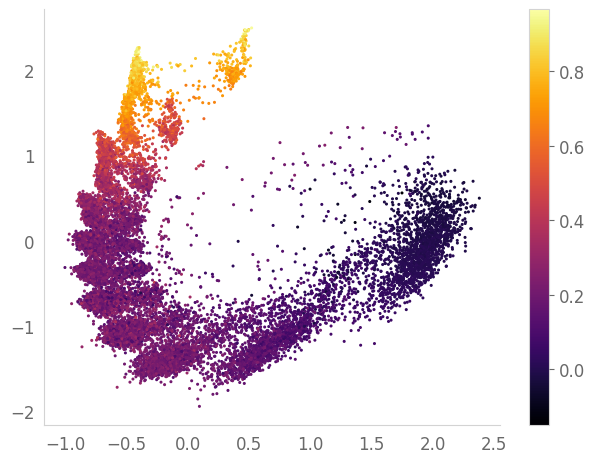

In [ ]:
import scprep
scprep.plot.scatter2d(df[['d1', 'd2']], c=df['samples'], cmap='viridis')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=xh_time_label, cmap='viridis')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=mh.reshape(-1), cmap='inferno')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=m_rate.reshape(-1), cmap='inferno')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=m_rate_log.reshape(-1), cmap='inferno')

<Axes: xlabel='d1', ylabel='d2'>

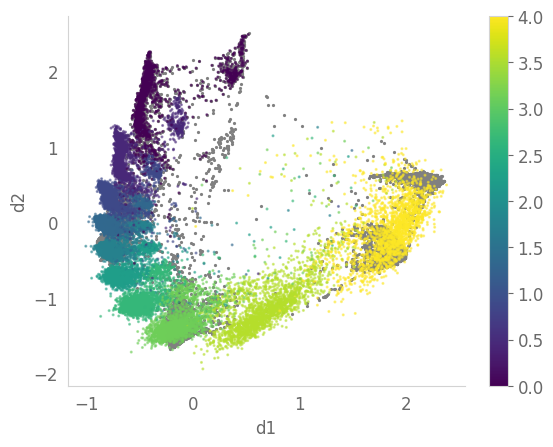

In [ ]:
import scprep
fig = plt.figure()
ax = fig.add_subplot(111); scprep.plot.scatter2d(df[['d1', 'd2']], c='gray', ax=ax)
scprep.plot.scatter2d(xh.reshape(-1, 2), c=xh_time_label, alpha=.5, cmap='viridis', ax=ax)

In [ ]:
np.random.seed(32)
groups = sorted(df['samples'].unique())
n_bins = 100
sample_time = np.linspace(np.min(groups), np.max(groups), n_bins)
from MIOFlow.utils import sample
n_points_sample = 50
data_t0 = sample(
    df, np.min(groups), size=(n_points_sample, ), 
    replace=False, to_torch=True, use_cuda=use_cuda
)
sample_time = torch.tensor(sample_time, dtype=data_t0.dtype, device=data_t0.device)

from MIOFlow.losses import hard_softmax
# threshold_factor = 0.3
with torch.no_grad():
    xh, mh = model(data_t0, sample_time, return_whole_sequence=True)
    xmseq = torch.cat([xh, mh.unsqueeze(2)], dim=-1)
    dxdts = torch.stack([model.func(sample_time[i], xmseq[i]) for i in range(len(sample_time))])
m_rate = dxdts[..., -1].cpu().numpy()
xh, mh = xh.cpu().numpy(), mh.cpu().numpy()
m_rate_log = m_rate / mh
xh_time_label = np.array(sample_time).repeat(n_points_sample, axis=0).reshape(-1)

/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/xingzhi/micromamba/envs/dmae/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


<Axes: >

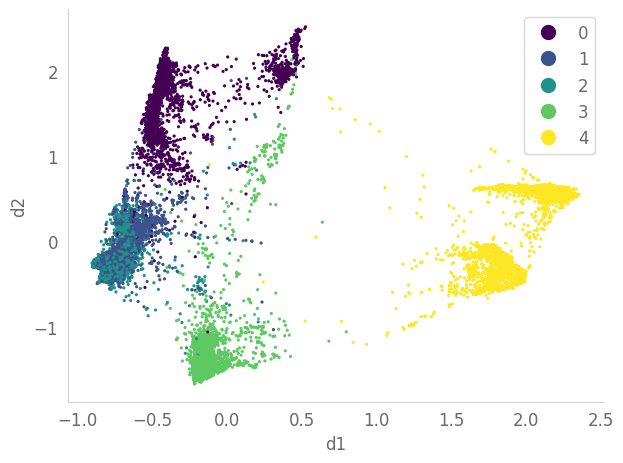

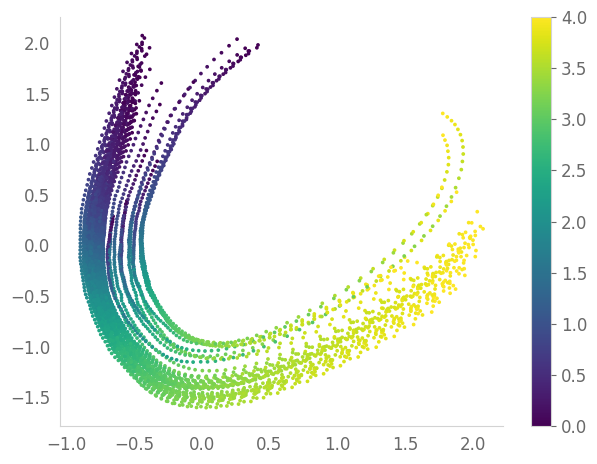

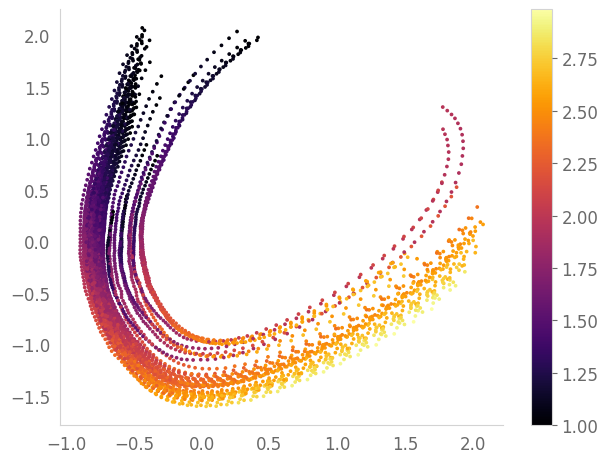

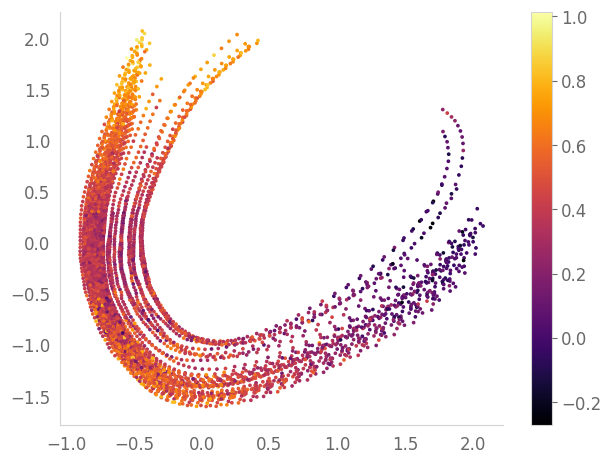

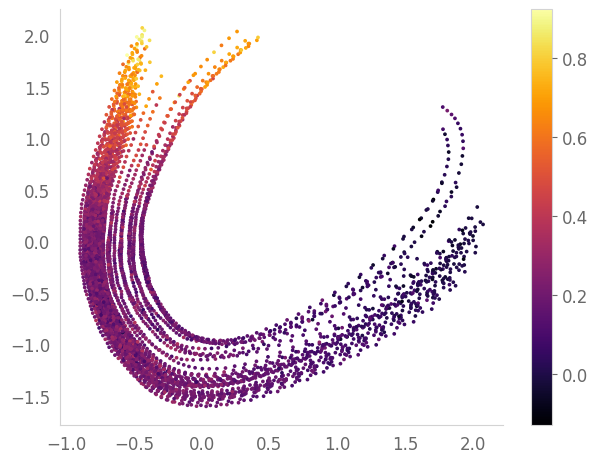

In [ ]:
import scprep
scprep.plot.scatter2d(df[['d1', 'd2']], c=df['samples'], cmap='viridis')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=xh_time_label, cmap='viridis')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=mh.reshape(-1), cmap='inferno')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=m_rate.reshape(-1), cmap='inferno')
scprep.plot.scatter2d(xh.reshape(-1, 2), c=m_rate_log.reshape(-1), cmap='inferno')

<Axes: xlabel='d1', ylabel='d2'>

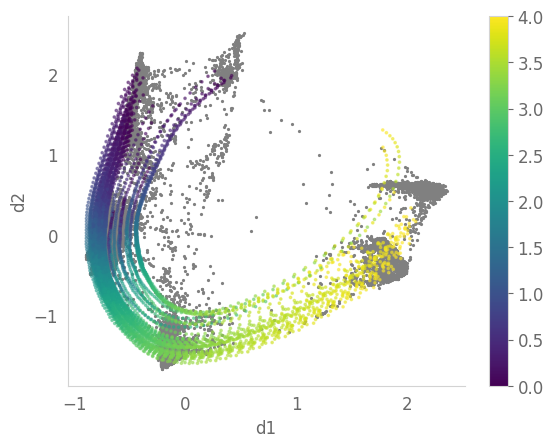

In [ ]:
import scprep
fig = plt.figure()
ax = fig.add_subplot(111); scprep.plot.scatter2d(df[['d1', 'd2']], c='gray', ax=ax)
scprep.plot.scatter2d(xh.reshape(-1, 2), c=xh_time_label, alpha=.5, cmap='viridis', ax=ax)